# **Directed Research Project**

In [ ]:
import numpy as np
import imageio.v2 as imageio
import os

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms

from models.lstm_auto_encoder import LSTMAutoEncoder
from models.lstm_auto_encoder_utils import visualize_model_predictions, evaluate_model
from custom_dataset import SegmentationDataset, visualize_semantic_dataloader
from training import segmentation_training

from utils import (
    createIfNotExist, getImagesInFolder, load_weights, 
    move_files
)

In [2]:
# Checking CUDA availability and setting the device accordingly
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"{device = }")

device = 'cpu'


### **Data Initialization/visualization**

Initializing list of pictures for cameras 1-3.

In [3]:
dataset_dir = "./Data/lums_plant_database"
os.makedirs(dataset_dir, exist_ok=True)

if os.path.isdir(dataset_dir):
    camera_1 = [os.path.join(dataset_dir, file) for file in os.listdir(dataset_dir) if file.endswith("_cam1.jpg")]
    camera_2 = [os.path.join(dataset_dir, file) for file in os.listdir(dataset_dir) if file.endswith("_cam2.jpg")]
    camera_3 = [os.path.join(dataset_dir, file) for file in os.listdir(dataset_dir) if file.endswith("_cam3.jpg")]


print("camera 1 list length:", len(camera_1))
print("camera 2 list length:", len(camera_2))
print("camera 3 list length:", len(camera_3))

camera 1 list length: 62
camera 2 list length: 47
camera 3 list length: 59


Here I created GIF's to aid in visualization for what each of the cameras captured. $\newline$ 
They can be seen in the "./data/camera_gifs" folder.

In [4]:
camera_dir = "./data/camera_gifs"
os.makedirs(camera_dir, exist_ok=True)

images = []
if not os.path.exists("./data/camera_gifs/cam1.gif"):
    for file in camera_1:
        images.append(imageio.imread(file))
    imageio.mimsave('./data/camera_gifs/cam1.gif', images)
    images = []

if not os.path.exists("./data/camera_gifs/cam2.gif"):
    for file in camera_2:
        images.append(imageio.imread(file))
    imageio.mimsave('./data/camera_gifs/cam2.gif', images)
    images = []

if not os.path.exists("./data/camera_gifs/cam3.gif"):
    for file in camera_3:
        images.append(imageio.imread(file))
    imageio.mimsave('./data/camera_gifs/cam3.gif', images)
    images = []


The progression of the fields from cameras 1-3 is smooth in the beginning. $\newline$ 
Towards the end, the camera lenz either gets shifted, moved, or placed in an entirely different area.  $\newline$ 
These images, towards the end, do not accurately showcase the progression and development of the fields.  $\newline$ 
To fix this, I updated the image lists to ensure that only the correct progression of the plants were shown.  $\newline$ 
This resulted in a decreased timeframe of the field development shown in the cell below.

In [5]:
updated_camera_1 = camera_1[:-23]
uc1_length = len(updated_camera_1)
print("\nCamera 1 list length:", uc1_length)
print("Start:", updated_camera_1[0], "\nEnd:", updated_camera_1[-1])

updated_camera_2 = camera_2[:-6]
uc2_length = len(updated_camera_2)
print("\nCamera 2 list length:", uc2_length)
print("Start:", updated_camera_2[0], "\nEnd:", updated_camera_2[-1])

updated_camera_3 = camera_3[:-11]
uc3_length = len(updated_camera_3)
print("\nCamera 3 list length:", uc3_length)
print("Start:", updated_camera_3[0], "\nEnd:", updated_camera_3[-1])


Camera 1 list length: 39
Start: ./Data/lums_plant_database\2024-02-11_cam1.jpg 
End: ./Data/lums_plant_database\2024-04-05_cam1.jpg

Camera 2 list length: 41
Start: ./Data/lums_plant_database\2024-02-11_cam2.jpg 
End: ./Data/lums_plant_database\2024-03-29_cam2.jpg

Camera 3 list length: 48
Start: ./Data/lums_plant_database\2024-02-11_cam3.jpg 
End: ./Data/lums_plant_database\2024-04-05_cam3.jpg


In [6]:
cleaned_camera_dir = "./data/cleaned_camera_gifs"
os.makedirs(cleaned_camera_dir, exist_ok=True)

images = []
cam1_path = "cam1.gif"
if not os.path.exists(os.path.join(cleaned_camera_dir, cam1_path)):
    for file in updated_camera_1:
        images.append(imageio.imread(file))
    imageio.mimsave(os.path.join(cleaned_camera_dir, cam1_path), images)
    images = []

cam2_path = "cam2.gif"
if not os.path.exists(os.path.join(cleaned_camera_dir, cam2_path)):
    for file in updated_camera_2:
        images.append(imageio.imread(file))
    imageio.mimsave(os.path.join(cleaned_camera_dir, cam2_path), images)
    images = []

cam3_path = "cam3.gif"
if not os.path.exists(os.path.join(cleaned_camera_dir, cam3_path)):
    for file in updated_camera_3:
        images.append(imageio.imread(file))
    imageio.mimsave(os.path.join(cleaned_camera_dir, cam3_path), images)
    images = []

Our data will be comprised of the images captured by camera 2. $\newline$ 
The top view of the images is less complex to handle than the side views captured by camera 1 and 3.

Creating the training and testing data folders

In [7]:
src_path = './data/lums_plant_database'
dest_dir = './data/lums_cam2_images'

createIfNotExist(dest_dir)
camera2_images = getImagesInFolder(path=src_path, extensions='_cam2.jpg')
camera2_images = camera2_images[:uc2_length]

if len([file for file in os.listdir(dest_dir)]) <= len(camera2_images):
    move_files(camera2_images, dest_dir=dest_dir)

We will be training and testing our model on the "./data/lums_cam2_images". $\newline$ 
Since our project and our camera is localized to the LUMS fields, overfitting to this specific location and dataset shouldn't be an issue.

In [8]:
# size for the images
resize = 256

# defining transformation for data preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((resize, resize)),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

images_path = './data/lums_cam2_images'
masks_path = './data/lums_cam2_masks'

# Creating training and testing datasets
segmentation_dataset = SegmentationDataset(image_folder_path=images_path, 
                                    mask_folder_path=masks_path, 
                                    transform=transform, 
                                    resize=resize)

# Creating training and testing dataloaders
BATCH_SIZE = 16
train_loader = DataLoader(segmentation_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(segmentation_dataset, batch_size=BATCH_SIZE, shuffle=False)


Visualization of the camera 2 field at a random time.

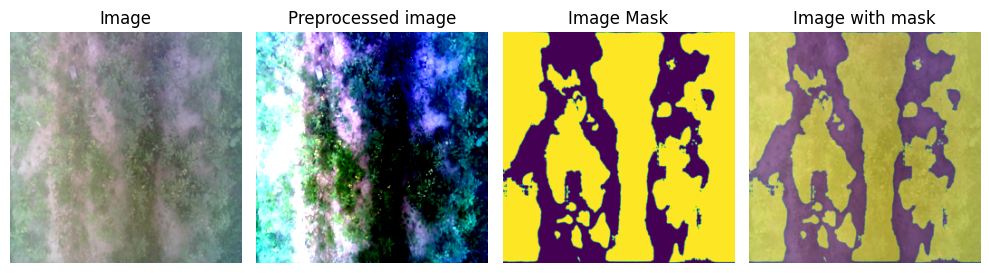

In [9]:
visualize_semantic_dataloader(train_loader)

## **Semantic Segmentation**

### **Initializing LSTM AutoEncoder Model**

This is the baseline model to showcase our results on the LUMS dataset. $\newline$ 
The architecture comprises of an encoder that produces a latent vector of the original image. $\newline$
The sequence is then rearranged to be fed into an LSTM to learn temporal dependancies. $\newline$
Finally, it is put through a decoder to recreate the image mask.

In [10]:
# Hyperparameters
feature_size = 1024
hidden_size = 512
num_layers = 10

# Model, loss, optimizer, scaler, and weights path
lstm_auto_encoder_model = LSTMAutoEncoder(feature_size, hidden_size, num_layers, BATCH_SIZE, device).to(device)

epochs = 50
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(lstm_auto_encoder_model.parameters(), lr=0.00001)

weights_dir = "./weights"
weights_path = os.path.join(weights_dir, "LSTM_AutoEncoder.pth")

os.makedirs(weights_dir, exist_ok=True)

load_weights(lstm_auto_encoder_model, weights_path, device)

if False:    # I change this myself to train or to just load the weights
    training_loss = segmentation_training(lstm_auto_encoder_model, train_loader, epochs, 
                                          criterion, optimizer, device, weights_path)
    lstm_auto_encoder_model.load_state_dict(torch.load(weights_path))

### **Visualization of images, predictions, and score reports**

mIoU isn't good because the masks we manually created where not fully accurate.

In [11]:
evaluate_model(lstm_auto_encoder_model, test_loader, device)

Precison: 0.731
Recall: 0.728
Accuracy: 0.805
Dice: 0.714
mIoU: 0.566


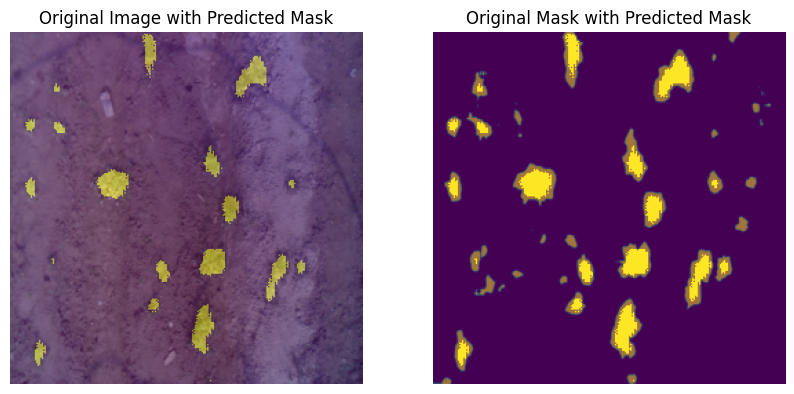

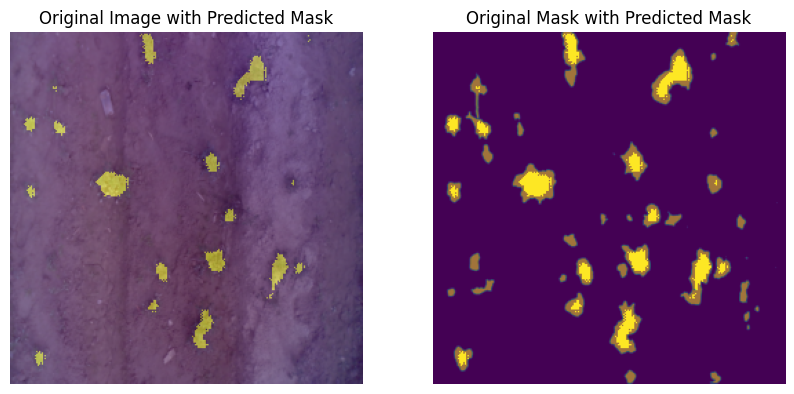

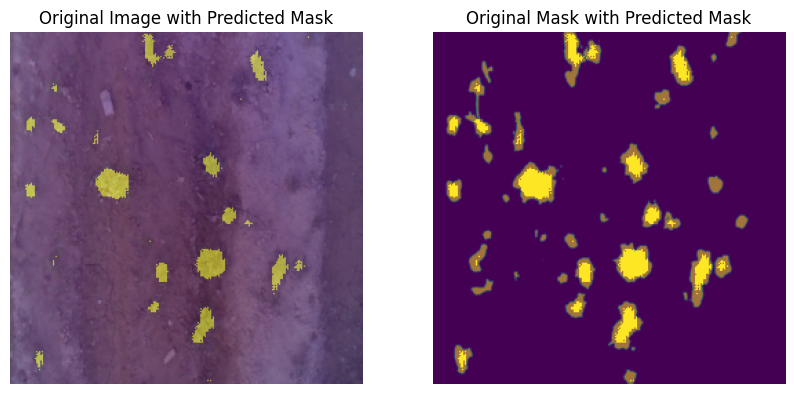

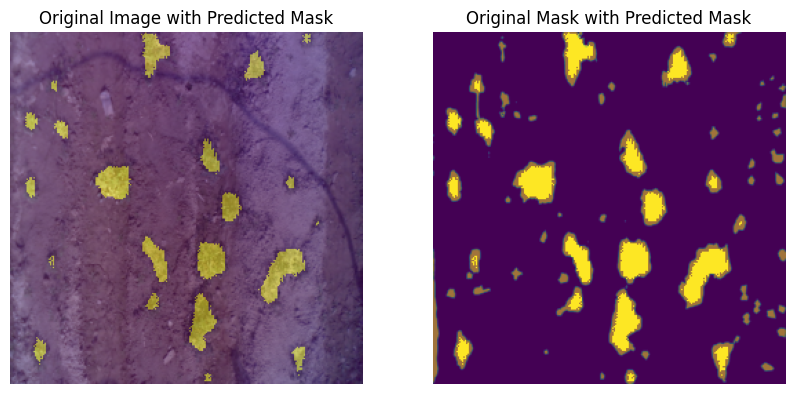

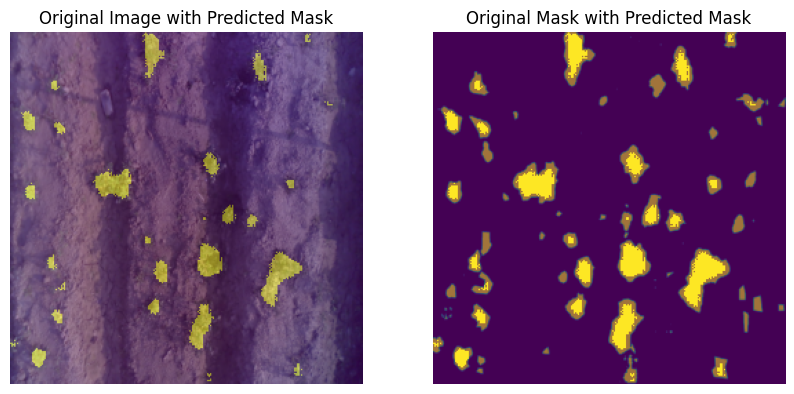

...

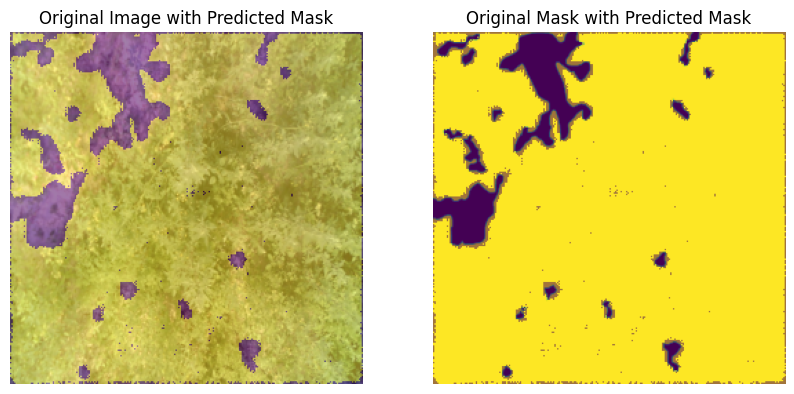

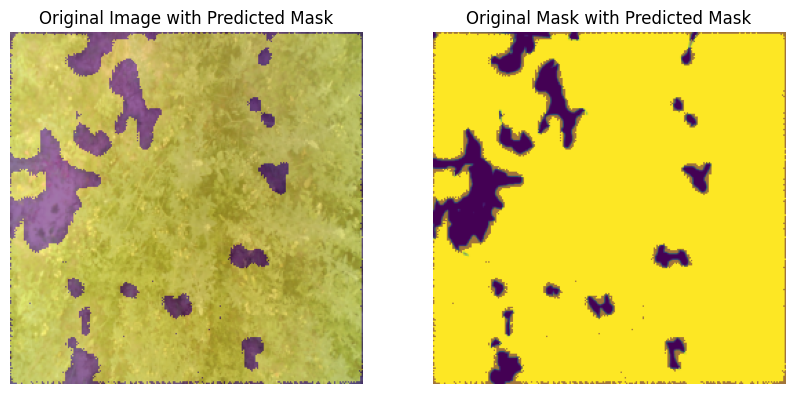

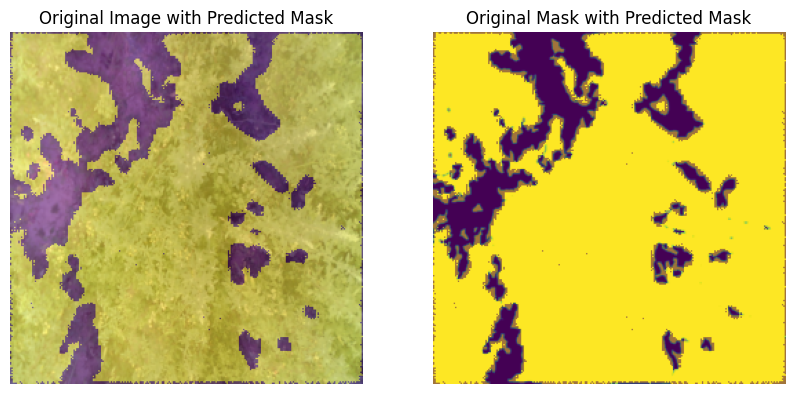

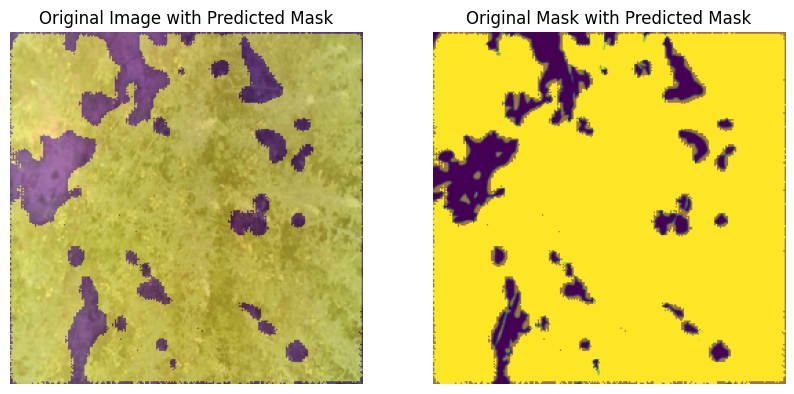

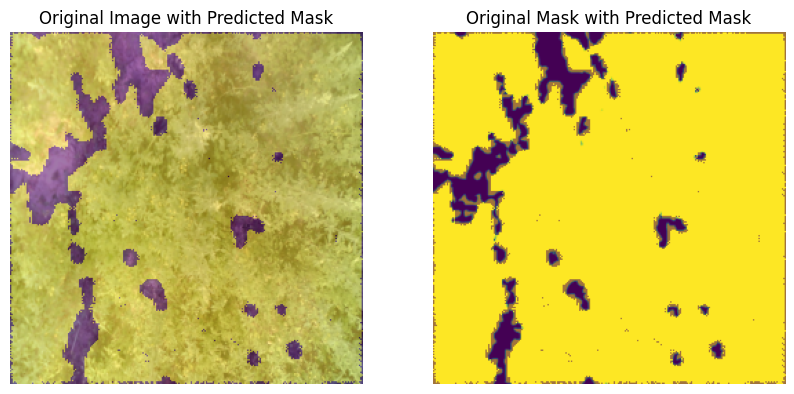

In [ ]:
visualize_model_predictions(lstm_auto_encoder_model, test_loader, device)